# Population Density and Over/Under Estimation Comparison

## 1. Read Data

In [1]:
import pandas as pd
from scipy.stats import spearmanr
import numpy as np
from scipy.stats import ttest_rel
import scipy.stats as stats

import matplotlib.pyplot as plt

import seaborn as sns
import geopandas as gpd

import contextily as ctx
from matplotlib.colors import LinearSegmentedColormap, Normalize

In [2]:
# read in all the accessibility data
shop_access= pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/shop_accessibility_20min.csv', encoding='latin1')

hos_access = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/hos_accessibility_20min.csv', encoding='latin1')

primary_sch_access = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/primary_school_accessibility_20min.csv', encoding='latin1')

secondary_sch_access = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/secondary_school_accessibility_20min.csv', encoding='latin1')

both_sch_access = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/both_school_accessibility_20min.csv', encoding='latin1')

gp_access = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/gp_accessibility_20min.csv', encoding='latin1')

# read in all the accessibility data
shop_access_40= pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/shop_accessibility_40min.csv', encoding='latin1')

hos_access_40 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/hos_accessibility_40min.csv', encoding='latin1')

primary_sch_access_40 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/primary_school_accessibility_40min.csv', encoding='latin1')

secondary_sch_access_40 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/secondary_school_accessibility_40min.csv', encoding='latin1')

both_sch_access_40 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/both_school_accessibility_40min.csv', encoding='latin1')

gp_access_40 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/gp_accessibility_40min.csv', encoding='latin1')

# read in all the accessibility data
shop_access_60= pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/shop_accessibility_60min.csv', encoding='latin1')

hos_access_60 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/hos_accessibility_60min.csv', encoding='latin1')

primary_sch_access_60 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/primary_school_accessibility_60min.csv', encoding='latin1')

secondary_sch_access_60 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/secondary_school_accessibility_60min.csv', encoding='latin1')

both_sch_access_60 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/both_school_accessibility_60min.csv', encoding='latin1')

gp_access_60 = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/calculated_accessibility/gp_accessibility_60min.csv', encoding='latin1')

read population density

In [3]:
msoa_info = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/regression_data/re_diff_osrm_encoded_reg.csv', encoding='latin1')

In [4]:
msoa_info.columns

Index(['destinationID', 'originID', 're_diff_tt', 'origin_lat', 'origin_lon',
       'destination_lat', 'destination_lon', 'euclidean_distance',
       'origin_region', 'destination_region', 'origin_region_Central_London',
       'origin_region_Inner_London', 'origin_region_Outer_London',
       'destination_region_Central_London', 'destination_region_Inner_London',
       'destination_region_Outer_London', 'dist_to_central_point_origin',
       'dist_to_central_point_dest', 'havsine_distance_OD',
       'origin_region_encoded', 'destination_region_encoded',
       'road_density_origin', 'road_density_dest', 'pop_density_origin',
       'pop_density_dest', 'area_origin', 'area_dest', 'pop_origin',
       'pop_dest'],
      dtype='object')

In [5]:
# keep the columns that are needed:
msoa_info = msoa_info[[ 'originID', 'origin_region', 'origin_region_encoded', 'pop_density_origin', 'road_density_origin']]

In [6]:
# keep only unique rows of msoa_info:
msoa_info = msoa_info.drop_duplicates()

In [7]:
msoa_info.shape

(1002, 5)

## 2. Now Join to see patterns for GP:

In [8]:
gp_access.head()

,msoa21cd,gp_accessibility_by_r5_20Min,gp_accessibility_by_here_20Min,gp_accessibility_by_osrm_20Min,gp_accessibility_by_valhalla_20Min
0,E02000318,55.0,44.0,68.0,115.0
1,E02000388,202.0,109.0,254.0,418.0
2,E02000652,161.0,84.0,182.0,266.0
3,E02000963,212.0,113.0,254.0,370.0
4,E02000651,178.0,90.0,203.0,295.0


In [9]:
# join the msoa info with the accessibility data for GP:
gp_access = gp_access.merge(msoa_info, left_on='msoa21cd', right_on='originID', how='inner')

gp_access_40 = gp_access_40.merge(msoa_info, left_on='msoa21cd', right_on='originID', how='inner')

gp_access_60 = gp_access_60.merge(msoa_info, left_on='msoa21cd', right_on='originID', how='inner')

In [10]:
def relative_difference(input_df, col_target, col_benchmark, new_col_name):
    epsilon_value = 1e-10   # to avoid division by zero

    # cap the value at + - 100
    relativer_diff = (input_df[col_target] - input_df[col_benchmark]) / (input_df[col_benchmark] + epsilon_value) *100    
    return relativer_diff

# calculate the relative difference between the accessibility of GP and the benchmark
gp_access['rel_diff_20_r5'] = relative_difference(gp_access, 'gp_accessibility_by_r5_20Min', 'gp_accessibility_by_here_20Min', 'rel_diff_20_r5')

gp_access['rel_diff_20_osrm'] = relative_difference(gp_access, 'gp_accessibility_by_osrm_20Min', 'gp_accessibility_by_here_20Min', 'rel_diff_20_osrm')

gp_access['rel_diff_20_valhalla'] = relative_difference(gp_access, 'gp_accessibility_by_valhalla_20Min', 'gp_accessibility_by_here_20Min', 'rel_diff_20_valhalla')   


gp_access_40['rel_diff_40_r5'] = relative_difference(gp_access_40, 'gp_accessibility_by_r5_40Min', 'gp_accessibility_by_here_40Min', 'rel_diff_40_r5')

gp_access_40['rel_diff_40_osrm'] = relative_difference(gp_access_40, 'gp_accessibility_by_osrm_40Min', 'gp_accessibility_by_here_40Min', 'rel_diff_40_osrm')

gp_access_40['rel_diff_40_valhalla'] = relative_difference(gp_access_40, 'gp_accessibility_by_valhalla_40Min', 'gp_accessibility_by_here_40Min', 'rel_diff_40_valhalla')

gp_access_60['rel_diff_60_r5'] = relative_difference(gp_access_60, 'gp_accessibility_by_r5_60Min', 'gp_accessibility_by_here_60Min', 'rel_diff_60_r5')

gp_access_60['rel_diff_60_osrm'] = relative_difference(gp_access_60, 'gp_accessibility_by_osrm_60Min', 'gp_accessibility_by_here_60Min', 'rel_diff_60_osrm')

gp_access_60['rel_diff_60_valhalla'] = relative_difference(gp_access_60, 'gp_accessibility_by_valhalla_60Min', 'gp_accessibility_by_here_60Min', 'rel_diff_60_valhalla')




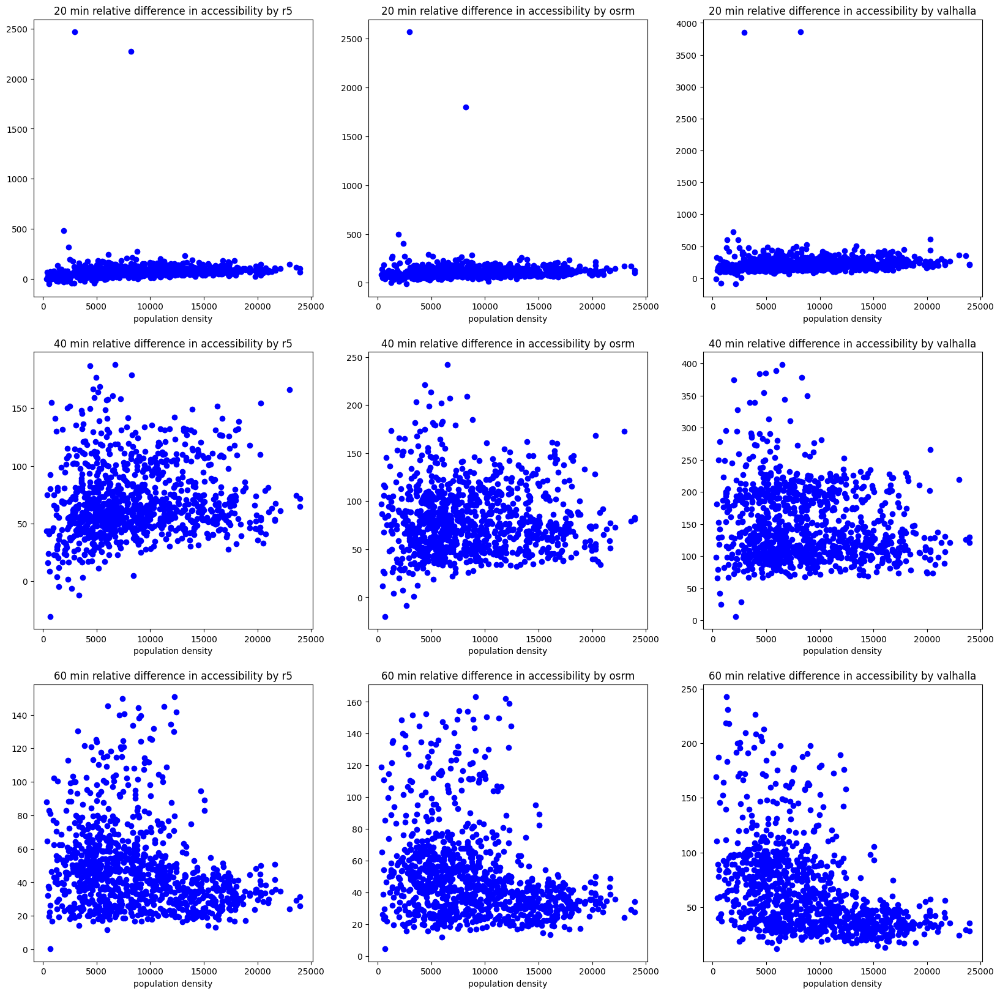

In [11]:
# scatter plot, x is population density, y is relative difference in accessibility, plot all 9:
plt.figure(figsize=(20, 20))

plt.subplot(3, 3, 1)

plt.scatter(gp_access['pop_density_origin'], gp_access['rel_diff_20_r5'], color='blue')

plt.title('20 min relative difference in accessibility by r5')

plt.xlabel('population density')


plt.subplot(3, 3, 2)


plt.scatter(gp_access['pop_density_origin'], gp_access['rel_diff_20_osrm'], color='blue')


plt.title('20 min relative difference in accessibility by osrm')


plt.xlabel('population density')


plt.subplot(3, 3, 3)


plt.scatter(gp_access['pop_density_origin'], gp_access['rel_diff_20_valhalla'], color='blue')


plt.title('20 min relative difference in accessibility by valhalla')


plt.xlabel('population density')


plt.subplot(3, 3, 4)


plt.scatter(gp_access_40['pop_density_origin'], gp_access_40['rel_diff_40_r5'], color='blue')


plt.title('40 min relative difference in accessibility by r5')


plt.xlabel('population density')


plt.subplot(3, 3, 5)


plt.scatter(gp_access_40['pop_density_origin'], gp_access_40['rel_diff_40_osrm'], color='blue')


plt.title('40 min relative difference in accessibility by osrm')


plt.xlabel('population density')


plt.subplot(3, 3, 6)


plt.scatter(gp_access_40['pop_density_origin'], gp_access_40['rel_diff_40_valhalla'], color='blue')


plt.title('40 min relative difference in accessibility by valhalla')


plt.xlabel('population density')


plt.subplot(3, 3, 7)


plt.scatter(gp_access_60['pop_density_origin'], gp_access_60['rel_diff_60_r5'], color='blue')


plt.title('60 min relative difference in accessibility by r5')


plt.xlabel('population density')


plt.subplot(3, 3, 8)


plt.scatter(gp_access_60['pop_density_origin'], gp_access_60['rel_diff_60_osrm'], color='blue')


plt.title('60 min relative difference in accessibility by osrm')


plt.xlabel('population density')


plt.subplot(3, 3, 9)


plt.scatter(gp_access_60['pop_density_origin'], gp_access_60['rel_diff_60_valhalla'], color='blue')


plt.title('60 min relative difference in accessibility by valhalla')


plt.xlabel('population density')



plt.show()



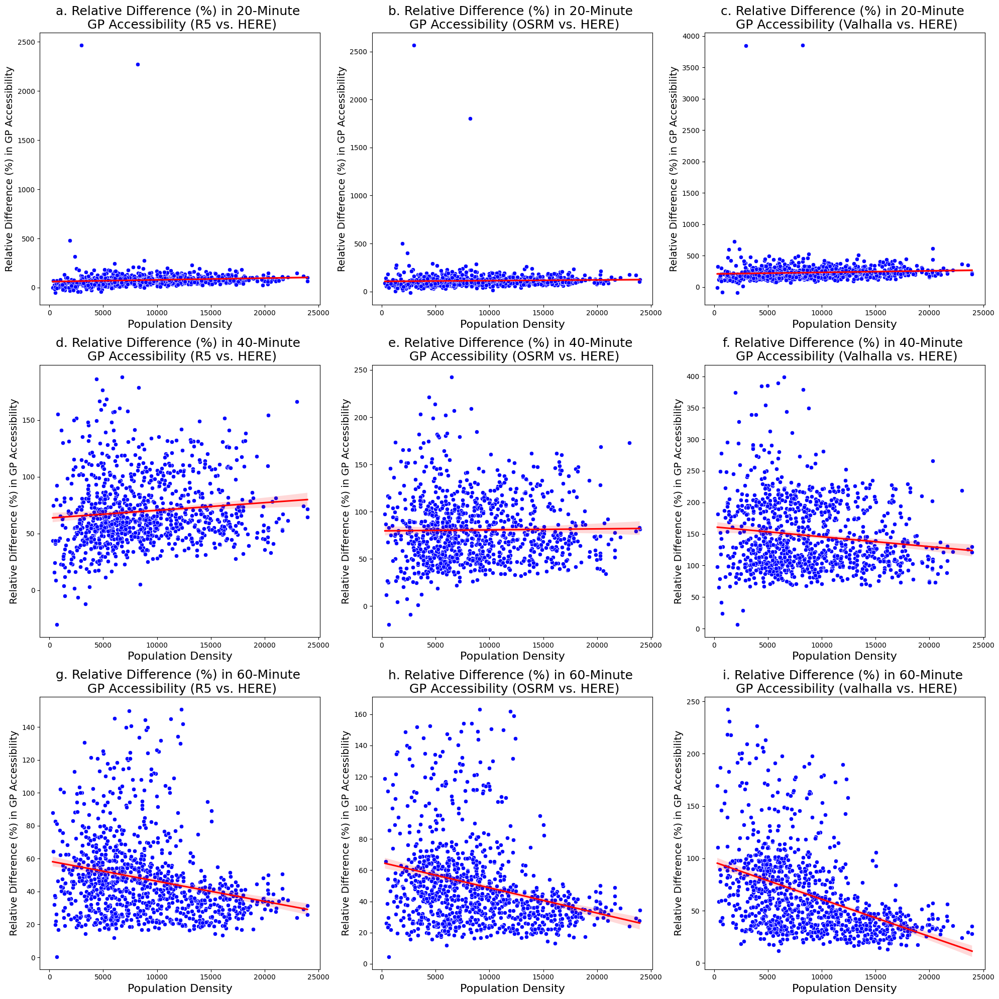

In [12]:
datasets = [
    (gp_access, '20', 'r5','(R5 vs. HERE)','a.'), 
    (gp_access, '20', 'osrm','(OSRM vs. HERE)', 'b.'), 
    (gp_access, '20', 'valhalla','(Valhalla vs. HERE)', 'c.'),
    (gp_access_40, '40', 'r5','(R5 vs. HERE)', 'd.'), 
    (gp_access_40, '40', 'osrm','(OSRM vs. HERE)', 'e.'), 
    (gp_access_40, '40', 'valhalla','(Valhalla vs. HERE)', 'f.'),
    (gp_access_60, '60', 'r5','(R5 vs. HERE)', 'g.'), 
    (gp_access_60, '60', 'osrm','(OSRM vs. HERE)', 'h.'), 
    (gp_access_60, '60', 'valhalla','(valhalla vs. HERE)', 'i.')
]
column_selection = 'pop_density_origin'

plt.figure(figsize=(20, 20))

for i, (data, time, method, title, heading) in enumerate(datasets, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(x=data[column_selection], y=data[f'rel_diff_{time}_{method}'], color='blue')
    sns.regplot(x=data[column_selection], y=data[f'rel_diff_{time}_{method}'], scatter=False, ci=95, color='red')
    plt.title(f'{heading} Relative Difference (%) in {time}-Minute \n GP Accessibility {title}', fontsize=18)
    plt.ylabel('Relative Difference (%) in GP Accessibility', fontsize=14)
    plt.xlabel('Population Density', fontsize=16)

plt.tight_layout()
plt.show()


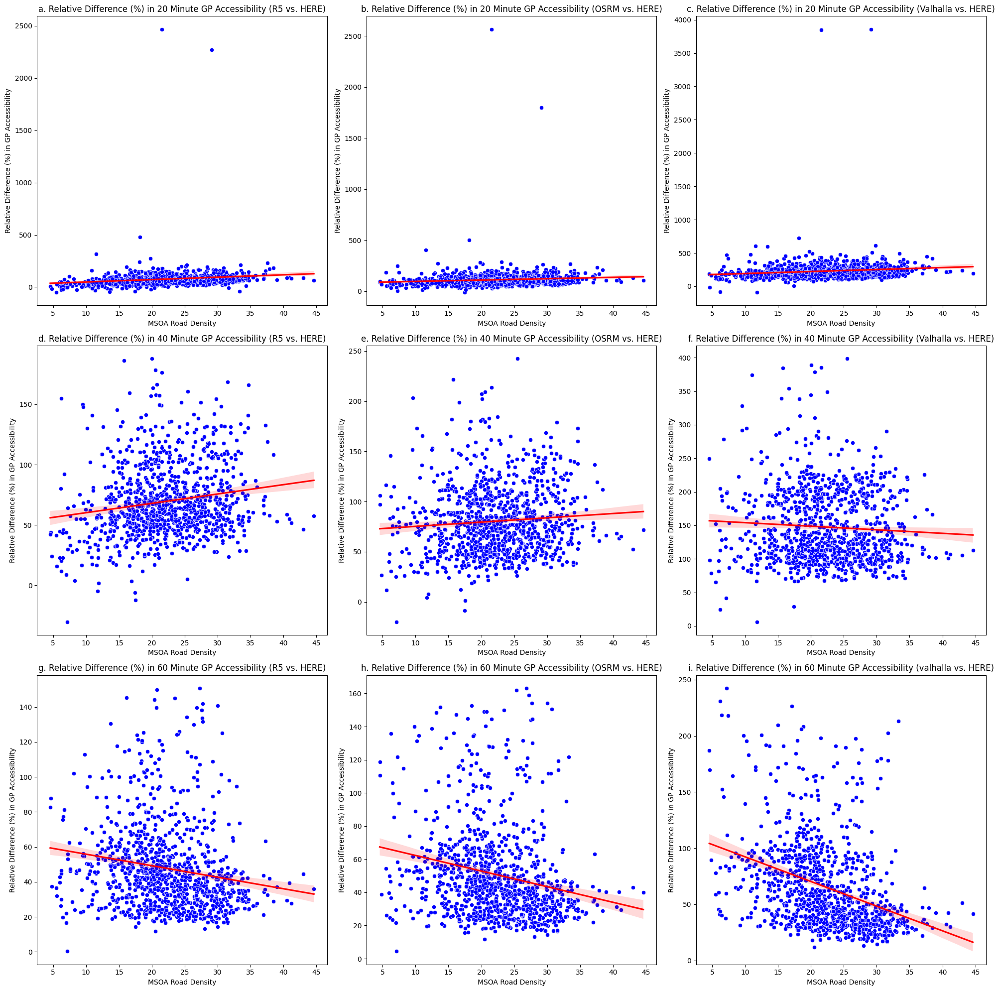

In [13]:
column_selection = 'road_density_origin'

plt.figure(figsize=(20, 20))

for i, (data, time, method, title, heading) in enumerate(datasets, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(x=data[column_selection], y=data[f'rel_diff_{time}_{method}'], color='blue')
    sns.regplot(x=data[column_selection], y=data[f'rel_diff_{time}_{method}'], scatter=False, ci=95, color='red')
    plt.title(f'{heading} Relative Difference (%) in {time} Minute GP Accessibility {title}')
    plt.ylabel('Relative Difference (%) in GP Accessibility')
    plt.xlabel('MSOA Road Density')

plt.tight_layout()
plt.show()


In [14]:
gp_access.head()

,msoa21cd,gp_accessibility_by_r5_20Min,gp_accessibility_by_here_20Min,gp_accessibility_by_osrm_20Min,gp_accessibility_by_valhalla_20Min,originID,origin_region,origin_region_encoded,pop_density_origin,road_density_origin,rel_diff_20_r5,rel_diff_20_osrm,rel_diff_20_valhalla
0,E02000318,55.0,44.0,68.0,115.0,E02000318,Inner London,1,10146.651484,22.655408,25.000000,54.545455,161.363636
1,E02000388,202.0,109.0,254.0,418.0,E02000388,Inner London,1,16271.540517,27.328442,85.321101,133.027523,283.486239
2,E02000652,161.0,84.0,182.0,266.0,E02000652,Inner London,1,11165.854830,19.119166,91.666667,116.666667,216.666667
3,E02000963,212.0,113.0,254.0,370.0,E02000963,Inner London,1,21664.947792,32.214765,87.610619,124.778761,227.433628
4,E02000651,178.0,90.0,203.0,295.0,E02000651,Inner London,1,7813.285511,20.018390,97.777778,125.555556,227.777778


In [15]:
# read shp file and plot its borders on folium map:
msoa_shape = gpd.read_file(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/msoa/england_msoa_2021.shp')

msoa_shape = msoa_shape[msoa_shape['msoa21cd'].isin(gp_access['msoa21cd'])]

## 3. Map London Population Density by MSOA:

In [16]:
msoa_shape = msoa_shape.merge(gp_access, left_on='msoa21cd', right_on='msoa21cd', how='inner')

In [17]:
msoa_shape.head()

,hclnm,hclnmw,label,msoa21cd,msoa21nm,name,geometry,gp_accessibility_by_r5_20Min,gp_accessibility_by_here_20Min,gp_accessibility_by_osrm_20Min,gp_accessibility_by_valhalla_20Min,originID,origin_region,origin_region_encoded,pop_density_origin,road_density_origin,rel_diff_20_r5,rel_diff_20_osrm,rel_diff_20_valhalla
0,Plumstead High Street,None,E92000001E12000007E09000011E02000318,E02000318,Greenwich 006,Greenwich 006,"POLYGON ((546024.231 178810.367, 546024.002 17...",55.0,44.0,68.0,115.0,E02000318,Inner London,1,10146.651484,22.655408,25.000000,54.545455,161.363636
1,Fulham Broadway,None,E92000001E12000007E09000013E02000388,E02000388,Hammersmith and Fulham 017,Hammersmith and Fulham 017,"POLYGON ((525600.834 177749.054, 525605.642 17...",202.0,109.0,254.0,418.0,E02000388,Inner London,1,16271.540517,27.328442,85.321101,133.027523,283.486239
2,Streatham Vale,None,E92000001E12000007E09000022E02000652,E02000652,Lambeth 035,Lambeth 035,"POLYGON ((529736.206 170431.382, 529736.499 17...",161.0,84.0,182.0,266.0,E02000652,Inner London,1,11165.854830,19.119166,91.666667,116.666667,216.666667
3,Queen's Park Gardens,None,E92000001E12000007E09000033E02000963,E02000963,Westminster 004,Westminster 004,"POLYGON ((524291.499 182989.539, 524295.596 18...",212.0,113.0,254.0,370.0,E02000963,Inner London,1,21664.947792,32.214765,87.610619,124.778761,227.433628
4,Streatham Common,None,E92000001E12000007E09000022E02000651,E02000651,Lambeth 034,Lambeth 034,"POLYGON ((531297.728 171022.395, 531284.488 17...",178.0,90.0,203.0,295.0,E02000651,Inner London,1,7813.285511,20.018390,97.777778,125.555556,227.777778


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib_scalebar.scalebar import ScaleBar

In [23]:
vmin = msoa_shape['pop_density_origin'].min()
vmax = msoa_shape['pop_density_origin'].max()

In [25]:
vmax

23965.99503459132

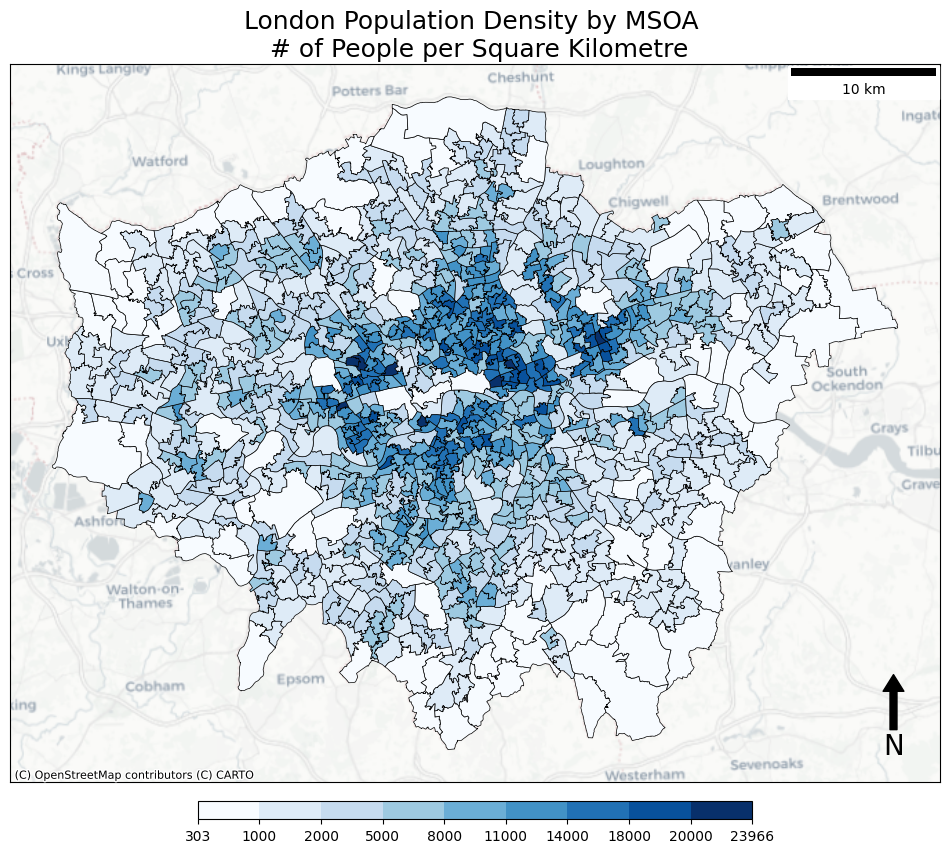

In [40]:
colors = ['#f7fbff', '#deebf7','#c6dbef','#9ecae1','#6baed6','#4292c6','#2171b5','#08519c','#08306b'] 
# Create the custom colormap
custom_cmap = ListedColormap(colors)

bins = [303, 1000, 2000, 5000, 8000, 11000, 14000, 18000, 20000, 23966]

# Create a norm to map the data values to the bins
norm = BoundaryNorm(bins, custom_cmap.N)


# map the population density with base map adn the borders of msoa:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
#msoa_shape.plot(column='pop_density_origin', cmap='OrRd', legend=True, ax=ax)
msoa_shape.plot(
        ax=ax,
        column='pop_density_origin',
        cmap= custom_cmap,
        legend=False,  # Disable individual legends
        edgecolor='black',
        linewidth=0.5
    )


ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)
ax.set_title("London Population Density by MSOA \n # of People per Square Kilometre", fontsize=18)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])

ax.add_artist(ScaleBar(1))

x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=20,
                xycoords=ax.transAxes)


cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm), ax=ax, orientation='horizontal', fraction=0.02, pad=0.02, aspect=30)
cbar.set_ticks(bins)
cbar.set_ticklabels([str(b) for b in bins])

plt.savefig('outputmaps/pop_density.tiff', dpi=400)

plt.show()



## 4. Calculate Difference / Density 

In [16]:
# new column diff/density:

gp_access['diff/density_r5_20'] = gp_access['rel_diff_20_r5'] / gp_access['pop_density_origin']

gp_access_40['diff/density_r5_40'] = gp_access_40['rel_diff_40_r5'] / gp_access_40['pop_density_origin']

gp_access_60['diff/density_r5_60'] = gp_access_60['rel_diff_60_r5'] / gp_access_60['pop_density_origin']


In [17]:
gp_access['diff/density_osrm_20'] = gp_access['rel_diff_20_osrm'] / gp_access['pop_density_origin']

gp_access_40['diff/density_osrm_40'] = gp_access_40['rel_diff_40_osrm'] / gp_access_40['pop_density_origin']

gp_access_60['diff/density_osrm_60'] = gp_access_60['rel_diff_60_osrm'] / gp_access_60['pop_density_origin']

In [18]:
gp_access['diff/density_valhalla_20'] = gp_access['rel_diff_20_valhalla'] / gp_access['pop_density_origin']

gp_access_40['diff/density_valhalla_40'] = gp_access_40['rel_diff_40_valhalla'] / gp_access_40['pop_density_origin']

gp_access_60['diff/density_valhalla_60'] = gp_access_60['rel_diff_60_valhalla'] / gp_access_60['pop_density_origin']

In [15]:
gp_access['diff/density_r5_20'] = gp_access['rel_diff_20_r5'] * gp_access['pop_density_origin']

gp_access_40['diff/density_r5_40'] = gp_access_40['rel_diff_40_r5'] * gp_access_40['pop_density_origin']

gp_access_60['diff/density_r5_60'] = gp_access_60['rel_diff_60_r5'] * gp_access_60['pop_density_origin']

gp_access['diff/density_osrm_20'] = gp_access['rel_diff_20_osrm'] * gp_access['pop_density_origin']

gp_access_40['diff/density_osrm_40'] = gp_access_40['rel_diff_40_osrm'] * gp_access_40['pop_density_origin']

gp_access_60['diff/density_osrm_60'] = gp_access_60['rel_diff_60_osrm'] * gp_access_60['pop_density_origin']

gp_access['diff/density_valhalla_20'] = gp_access['rel_diff_20_valhalla'] * gp_access['pop_density_origin']

gp_access_40['diff/density_valhalla_40'] = gp_access_40['rel_diff_40_valhalla'] * gp_access_40['pop_density_origin']

gp_access_60['diff/density_valhalla_60'] = gp_access_60['rel_diff_60_valhalla'] * gp_access_60['pop_density_origin']


In [19]:
# plot the map of the relative difference in accessibility by r5:

msoa_shape = msoa_shape.merge(gp_access, left_on='msoa21cd', right_on='msoa21cd', how='inner')

msoa_shape = msoa_shape.merge(gp_access_40, left_on='msoa21cd', right_on='msoa21cd', how='inner')

msoa_shape = msoa_shape.merge(gp_access_60, left_on='msoa21cd', right_on='msoa21cd', how='inner')

msoa_shape.columns


Index(['hclnm', 'hclnmw', 'label', 'msoa21cd', 'msoa21nm', 'name', 'geometry',
       'gp_accessibility_by_r5_20Min', 'gp_accessibility_by_here_20Min',
       'gp_accessibility_by_osrm_20Min', 'gp_accessibility_by_valhalla_20Min',
       'originID_x', 'origin_region_x', 'origin_region_encoded_x',
       'pop_density_origin_x', 'road_density_origin_x', 'rel_diff_20_r5',
       'rel_diff_20_osrm', 'rel_diff_20_valhalla', 'diff/density_r5_20',
       'diff/density_osrm_20', 'diff/density_valhalla_20',
       'gp_accessibility_by_r5_40Min', 'gp_accessibility_by_here_40Min',
       'gp_accessibility_by_osrm_40Min', 'gp_accessibility_by_valhalla_40Min',
       'originID_y', 'origin_region_y', 'origin_region_encoded_y',
       'pop_density_origin_y', 'road_density_origin_y', 'rel_diff_40_r5',
       'rel_diff_40_osrm', 'rel_diff_40_valhalla', 'diff/density_r5_40',
       'diff/density_osrm_40', 'diff/density_valhalla_40',
       'gp_accessibility_by_r5_60Min', 'gp_accessibility_by_here_60Min'

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib_scalebar.scalebar import ScaleBar


In [21]:
# Adjust the buffer values to control the size of the black and white area
xmin, ymin, xmax, ymax = msoa_shape.total_bounds
buffer_size = 0.1  # Adjust as needed based on the coordinate reference system (CRS)
xmin -= buffer_size
ymin -= buffer_size
xmax += buffer_size
ymax += buffer_size

In [59]:
# time 100 for columns in cloumns: 'diff/density_r5_20','diff/density_osrm_20', 'diff/density_valhalla_20',           'diff/density_r5_40','diff/density_osrm_40', 'diff/density_valhalla_40','diff/density_r5_60','diff/density_osrm_60', 'diff/density_valhalla_60'
# make these colomuns 100 times larger:
msoa_shape['diff/density_r5_20'] = msoa_shape['diff/density_r5_20']/100

msoa_shape['diff/density_osrm_20'] = msoa_shape['diff/density_osrm_20']/100

msoa_shape['diff/density_valhalla_20'] = msoa_shape['diff/density_valhalla_20']/100

msoa_shape['diff/density_r5_40'] = msoa_shape['diff/density_r5_40']/100

msoa_shape['diff/density_osrm_40'] = msoa_shape['diff/density_osrm_40']/100

msoa_shape['diff/density_valhalla_40'] = msoa_shape['diff/density_valhalla_40']/100

msoa_shape['diff/density_r5_60'] = msoa_shape['diff/density_r5_60']/100

msoa_shape['diff/density_osrm_60'] = msoa_shape['diff/density_osrm_60']/100

msoa_shape['diff/density_valhalla_60'] = msoa_shape['diff/density_valhalla_60']/100

In [22]:
columns = ['diff/density_r5_20','diff/density_osrm_20', 'diff/density_valhalla_20',
           'diff/density_r5_40','diff/density_osrm_40', 'diff/density_valhalla_40',
           'diff/density_r5_60','diff/density_osrm_60', 'diff/density_valhalla_60']

titles = ['a. R5 vs. HERE Relative Difference for\n GP 20 Minutes Accessibility per Unit Population Density \n [% / (# of people per square kilometre)]', 
          'b. OSRM vs. HERE Relative Difference for\n GP 20 Minutes Accessibility per Unit Population Density\n [% / (# of people per square kilometre)]',
          'c. Valhalla vs. HERE Relative Difference for \n GP 20 Minutes Accessibility per Unit Population Density \n[% / (# of people per square kilometre)]',
          'd. R5 vs. HERE Relative Difference for \n GP 40 Minutes Accessibility per Unit Population Density \n[% / (# of people per square kilometre)]', 
          'e. OSRM vs. HERE Relative Difference for \n GP 40 Minutes Accessibility per Unit Population Density \n[% / (# of people per square kilometre)]',
          'f. Valhalla vs. HERE Relative Difference for \n GP 40 Minutes Accessibility per Unit Population Density \n[% / (# of people per square kilometre)]',
          'g. R5 vs. HERE Relative Difference for \n GP 60 Minutes Accessibility per Unit Population Density \n[% / (# of people per square kilometre)]', 
          'h. OSRM vs. HERE Relative Difference for \n GP 60 Minutes Accessibility per Unit Population Density \n[ % / (# of people per square kilometre)]',
          'i. Valhalla vs. HERE Relative Difference for \n GP 60 Minutes Accessibility per Unit Population Density \n[% / (# of people per square kilometre)]',
          ]

vmin = min(msoa_shape[columns].min())
vmax = max(msoa_shape[columns].max())

In [21]:
vmin

-200825.738869368

In [22]:
vmax

31677809.80360854

## code for rel_diff/pop_den

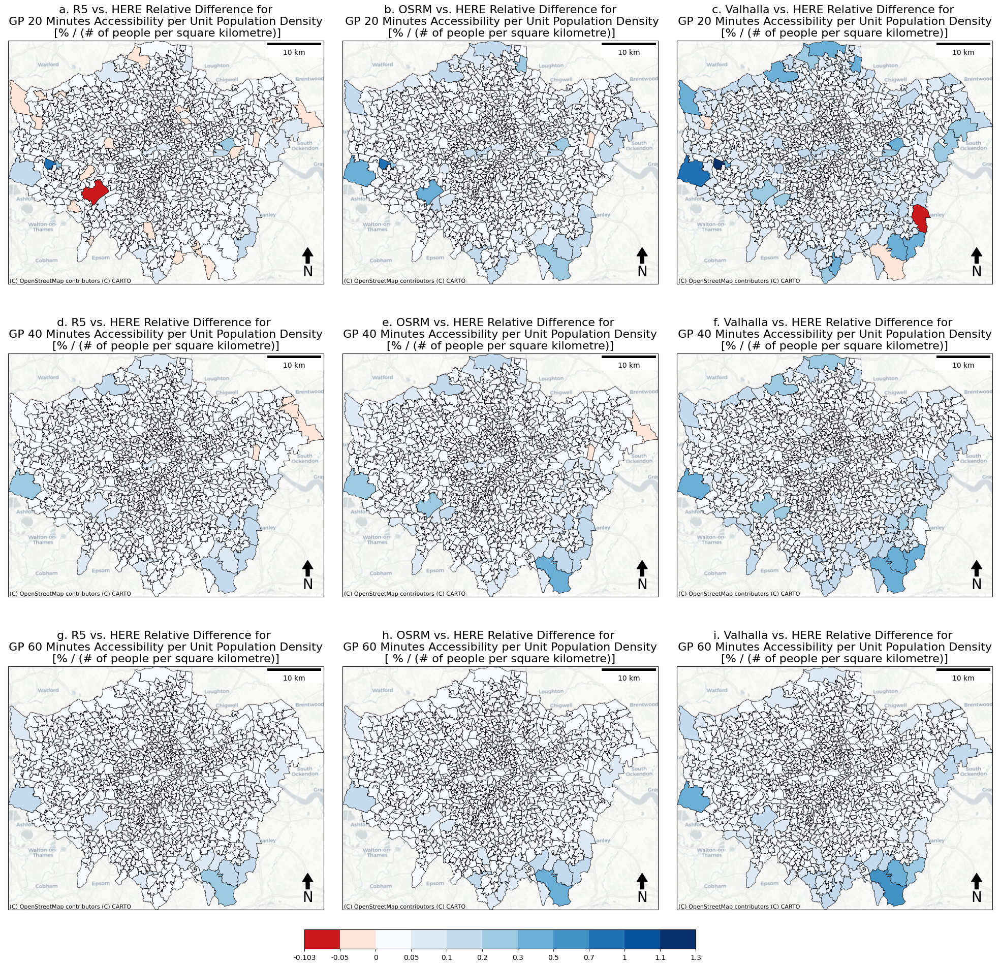

In [23]:

# Define the bins for the discrete color intervals
#bins = [-100, -70, -40, 0, 20, 50, 80, 100, 200, 300, 400, 19000]
bins = [-0.103, -0.05, 0, 0.05, 0.1, 0.2, 0.3, 0.5, 0.7, 1, 1.1, 1.3]
# Define corresponding colors for each bin
#colors = ['#ca0020', '#f4a582', '#fddbc7', '#f7f7f7', '#d1e5f0', '#92c5de', '#4393c3', '#2166ac', '#053061', '#000000']  # Custom colors
#colors = ['#67001f','#b2182b','#d6604d','#f4a582','#fddbc7','#f7f7f7','#d1e5f0','#92c5de','#4393c3','#2166ac','#053061']

colors = ['#cb181d', '#fee5d9', 
          '#f7fbff', '#deebf7','#c6dbef','#9ecae1','#6baed6','#4292c6','#2171b5','#08519c','#08306b'] 
# Create the custom colormap
custom_cmap = ListedColormap(colors)

# Create a norm to map the data values to the bins
norm = BoundaryNorm(bins, custom_cmap.N)

# Create a figure with subplots
fig, axes = plt.subplots(3, 3, figsize=(25, 25))

# Adjust the spacing between subplots
fig.subplots_adjust(wspace=0.06, hspace=0.000000000000000000000000001)

# Flatten axes for easy iteration
axes = axes.flatten()

counter = 0 
for ax, column in zip(axes, columns):
    msoa_shape.plot(
        ax=ax,
        column=column,
        cmap=custom_cmap,
        norm=norm,
        legend=False,  # Disable individual legends
        edgecolor='black',
        linewidth=0.5
    )
    # Add basemap
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        crs=msoa_shape.crs.to_string(),
        zoom=10
    )
    # Set the extent to include the buffered area
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    # Remove axis labels (coordinates)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([])
    ax.set_yticks([])
    # Add a title for each subplot
    ax.set_title(titles[counter], fontsize=16)
    ax.add_artist(ScaleBar(1))
    counter += 1
    x, y, arrow_length = 0.95, 0.15, 0.1
    ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=20,
                xycoords=ax.transAxes)

# Add a single colorbar for all subplots
#ig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm), ax=axes, orientation='horizontal', fraction=0.02, pad=0.02)

cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm), ax=axes, orientation='horizontal', fraction=0.02, pad=0.02)
cbar.set_ticks(bins)
cbar.set_ticklabels([str(b) for b in bins])
# Save as TIFF
plt.savefig('outputmaps/gp_20_40_60_rediff_over_pop_density_vvv.tiff', dpi=400)

# Show the plot (optional)
plt.show()


## code for rel_diff * pop_den

In [31]:
columns = ['diff/density_r5_20','diff/density_osrm_20', 'diff/density_valhalla_20',
           'diff/density_r5_40','diff/density_osrm_40', 'diff/density_valhalla_40',
           'diff/density_r5_60','diff/density_osrm_60', 'diff/density_valhalla_60']

titles = ['a. R5 vs. HERE Relative Difference for\n GP 20 Minutes Accessibility \n per Unit Population Density \n [% * (# of people per square kilometre)]', 
          'b. OSRM vs. HERE Relative Difference for\n GP 20 Minutes Accessibility \n  per Unit Population Density\n [% * (# of people per square kilometre)]',
          'c. Valhalla vs. HERE Relative Difference for \n GP 20 Minutes Accessibility \n per Unit Population Density \n[% * (# of people per square kilometre)]',
          'd. R5 vs. HERE Relative Difference for \n GP 40 Minutes Accessibility \n per Unit Population Density \n[% * (# of people per square kilometre)]', 
          'e. OSRM vs. HERE Relative Difference for \n GP 40 Minutes Accessibility \n per Unit Population Density \n[% * (# of people per square kilometre)]',
          'f. Valhalla vs. HERE Relative Difference for \n GP 40 Minutes Accessibility\n  per Unit Population Density \n[% * (# of people per square kilometre)]',
          'g. R5 vs. HERE Relative Difference for \n GP 60 Minutes Accessibility \n per Unit Population Density \n[% * (# of people per square kilometre)]', 
          'h. OSRM vs. HERE Relative Difference for \n GP 60 Minutes Accessibility \n per Unit Population Density \n[ % * (# of people per square kilometre)]',
          'i. Valhalla vs. HERE Relative Difference for \n GP 60 Minutes Accessibility\n  per Unit Population Density \n[% * (# of people per square kilometre)]',
          ]

vmin = min(msoa_shape[columns].min())
vmax = max(msoa_shape[columns].max())

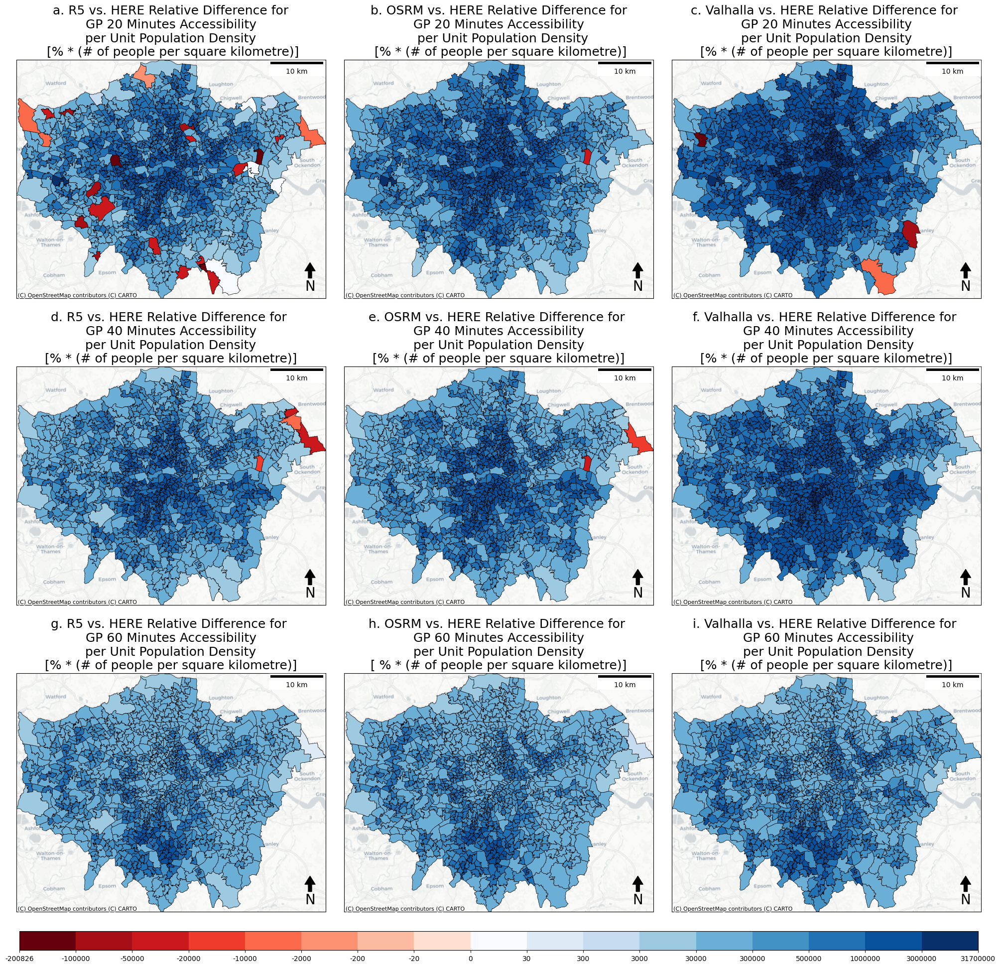

In [32]:

# Define the bins for the discrete color intervals
#bins = [-100, -70, -40, 0, 20, 50, 80, 100, 200, 300, 400, 19000]
bins = [-200826, -100000, -50000, -20000, -10000, -2000, -200, -20, 
        0, 30, 300, 3000, 30000, 300000, 500000, 1000000, 3000000, 31700000]
# Define corresponding colors for each bin
#colors = ['#ca0020', '#f4a582', '#fddbc7', '#f7f7f7', '#d1e5f0', '#92c5de', '#4393c3', '#2166ac', '#053061', '#000000']  # Custom colors
#colors = ['#67001f','#b2182b','#d6604d','#f4a582','#fddbc7','#f7f7f7','#d1e5f0','#92c5de','#4393c3','#2166ac','#053061']
colors = ['#67000d','#a50f15','#cb181d','#ef3b2c','#fb6a4a','#fc9272','#fcbba1','#fee0d2',
    '#f7fbff','#deebf7','#c6dbef','#9ecae1','#6baed6','#4292c6','#2171b5','#08519c','#08306b'] 
#colors = ['#cb181d', '#fee5d9', 
  #        '#f7fbff', '#deebf7','#c6dbef','#9ecae1','#6baed6','#4292c6','#2171b5','#08519c','#08306b'] 
# Create the custom colormap
custom_cmap = ListedColormap(colors)

# Create a norm to map the data values to the bins
norm = BoundaryNorm(bins, custom_cmap.N)

# Create a figure with subplots
fig, axes = plt.subplots(3, 3, figsize=(25, 25))

# Adjust the spacing between subplots
fig.subplots_adjust(wspace=0.06, hspace=0.000000000000000000000000001)

# Flatten axes for easy iteration
axes = axes.flatten()

counter = 0 
for ax, column in zip(axes, columns):
    msoa_shape.plot(
        ax=ax,
        column=column,
        cmap=custom_cmap,
        norm=norm,
        legend=False,  # Disable individual legends
        edgecolor='black',
        linewidth=0.5
    )
    # Add basemap
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        crs=msoa_shape.crs.to_string(),
        zoom=10
    )
    # Set the extent to include the buffered area
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    # Remove axis labels (coordinates)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([])
    ax.set_yticks([])
    # Add a title for each subplot
    ax.set_title(titles[counter], fontsize=18)
    ax.add_artist(ScaleBar(1))
    counter += 1
    x, y, arrow_length = 0.95, 0.15, 0.1
    ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=20,
                xycoords=ax.transAxes)

# Add a single colorbar for all subplots
#ig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm), ax=axes, orientation='horizontal', fraction=0.02, pad=0.02)

cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm), ax=axes, orientation='horizontal', fraction=0.02, pad=0.02, aspect=50)  
cbar.set_ticks(bins)
cbar.set_ticklabels([str(b) for b in bins])


# Save as TIFF
plt.savefig('outputmaps/gp_20_40_60_rediff_over_pop_density_.tiff', dpi=400)

# Show the plot (optional)
plt.show()
